# Velocity Change in Soil -- Harper Farm

This notebook:

1) Use DAS Auto-correlation to calculate velocity changes

2) Careful denoising for dV/V likelihood

In [1]:
import os
os.environ["HDF5_USE_FILE_LOCKING"] = "FALSE"
import h5py

import sys
sys.path.append(".")
from das_util import read_decimate, get_tstamp, calc_NFFT
from das_util import next_power_of_2


import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline
matplotlib.rcParams.update({'font.size': 16})

# import cv2
import numpy as np
import pandas as pd

from tqdm import tqdm

import scipy
import scipy.signal as sgn
from scipy.signal import find_peaks
from scipy.interpolate import interp1d, RegularGridInterpolator
from scipy.ndimage import gaussian_filter1d, gaussian_filter
from obspy import UTCDateTime
from scipy.ndimage import correlate

In [2]:
with h5py.File('/fd1/QibinShi_data/England_farm/autocorr_25_50Hz.hdf5', 'r') as f:
    corr_all_time = f['autocorr'][:, :, 2500:, 0]
corr_all_time.shape

(51, 482, 2501)

In [ ]:
# %% read raw data from the saved HDF5
datah5 = '/fd1/QibinShi_data/England_farm/farmDAS_harper_0_24hr.hdf5'
with h5py.File(datah5, 'r') as f:
    full_time_data_h5 = f["data"][:]
    sample_rate_h5 = f["dt"][()]
    time_stamp_h5 = f["timestamp"][:]
full_time_data = full_time_data_h5
sample_rate = sample_rate_h5
acqu_time = np.array([UTCDateTime(i) for i in time_stamp_h5])

In [13]:
full_time_data.shape

(50, 12960000)

### Functions for DVV and PDF denoising

In [4]:
def fk_filter_2cones(vsp, w1=0, w2=0, cone1=False, cone2=False):
    n1, n2 = vsp.shape
    nf = next_power_of_2(n1)
    nk = next_power_of_2(n2)

    nf2=int(nf/2)
    nk2=int(nk/2)
    
    fk2d = np.fft.fft2(vsp, s=(nf,nk))
    fk2d = np.fft.fftshift(fk2d, axes=(-2,-1))
    
    nw1 = int(np.ceil(w1*nk))
    nw2 = int(np.ceil(w2*nf))

    mask1=np.ones((nf,nk), dtype=np.float64)
    mask2=np.ones((nf,nk), dtype=np.float64)

    if cone1:
        for j in np.arange(nk2-nw1, nk2+1):
            th1 = int((j-nk2+nw1) * nf2/nw1)

            mask1[:th1, j] = 0
            mask1[nf-th1:, j] = 0
            mask1[:th1, nk-j] = 0
            mask1[nf-th1:, nk-j] = 0

    if cone2:
        for j in np.arange(0, nk2):
            th2 = int(nf2 - (nw2/nk2)*(nk2-j))
            mask2[th2:nf-th2+1, j] = 0
            if j != 0:
                mask2[th2:nf-th2+1, nk-j] = 0


    mask = mask2*mask1
    
    filtered_2d = fk2d * mask
    tmp = np.fft.ifftshift(filtered_2d)
    output = np.fft.ifft2(tmp, s=(nk,nf), axes=(-1, -2))
    
    return output[:n1,:n2], filtered_2d, fk2d

In [5]:
def stretch(wave1, wave2, time, maxshift=0, min_ratio=0.1, max_ratio=2):

    interp_f = interp1d(time, wave2, bounds_error=False, fill_value=0.)
    n1 = np.sum(np.square(wave1))
    dt = time[1] - time[0]
    cc = 0
    relative_ratio = 1
    npts = len(time)

    for ratio in np.arange(min_ratio, max_ratio, 0.01):
        dt_new = dt / ratio
        time_new = np.arange(time[0], time[-1], dt_new)
        wave_new = interp_f(time_new)
        
        n2 = np.sum(np.square(wave_new))
        corr = sgn.correlate(wave1, wave_new) / np.sqrt(n1 * n2)

        l_maxshift = min(len(wave_new), maxshift)
        r_maxshift = min(len(wave1), maxshift)

        st_pt = len(wave_new) - l_maxshift
        en_pt = len(wave_new) + r_maxshift+1

        cc_best = np.nanmax(corr[st_pt: en_pt])

        if cc < cc_best:
            cc = cc_best
            relative_ratio = ratio

    dt_new = dt / relative_ratio
    time_new = np.arange(time[0], time[-1], dt_new)
    wave_new = interp_f(time_new)
    
    
    return wave_new, np.arange(len(wave_new))*dt, relative_ratio, cc

In [6]:
def stretch_distribution(wave1, wave2, time, maxshift=0, min_ratio=0.1, max_ratio=2):

    stretch_range = np.arange(min_ratio, max_ratio, 0.01)
    
    interp_f = interp1d(time, wave2, bounds_error=False, fill_value=0.)
    n1 = np.sum(np.square(wave1))
    dt = time[1] - time[0]
    cc = np.zeros(len(stretch_range), dtype = np.float32)
    npts = len(time)

    for i, ratio in enumerate(stretch_range):
        dt_new = dt / ratio
        time_new = np.arange(time[0], time[-1], dt_new)
        wave_new = interp_f(time_new)
        
        n2 = np.sum(np.square(wave_new))
        corr = sgn.correlate(wave1, wave_new) / np.sqrt(n1 * n2)

        l_maxshift = min(len(wave_new), maxshift)
        r_maxshift = min(len(wave1), maxshift)

        st_pt = len(wave_new) - l_maxshift
        en_pt = len(wave_new) + r_maxshift+1

        cc[i] = np.nanmax(corr[st_pt: en_pt])
    
    return stretch_range, cc

# Data --DAS PSD

51 channels

2408 time segments

129 frequency points

In [7]:
### Here is how the PSD data was saved
# with h5py.File('/fd1/QibinShi_data/England_farm/psd_all.hdf5', 'w') as f:
#     f.create_dataset("psd_all_time", data=PSD_all_time)
#     f.create_dataset("frequency", data=freq)
#     f.create_dataset("daslist", data=file_list.astype('S'), dtype='S100')

with h5py.File('/fd1/QibinShi_data/England_farm/psd_all.hdf5', 'r') as f:
    file_list = f['daslist'][:].astype('U')
    PSD_all_time = f['psd_all_time'][:]
    freq = f['frequency'][:]
    
acqu_time = np.array([get_tstamp(i) for i in file_list])
start_file = np.arange(0, len(acqu_time), 5)
time_stamps = acqu_time[start_file]

## Mean PSD over channels
ave_psd=np.mean(np.sum(PSD_all_time[0:44, :, 52:90], axis=-1) * (freq[1]-freq[0]), axis=0)

## Index on the hour
hourly_index = [67,127,187,247,299,359,419,466,526,586,646,706,766,826,886,946,1003,1063,1123,
         1183,1243,1302,1362,1422,1482,1542,1599,1659,1719,1779,1839,1899,1959,2019,
         2078,2138,2198,2258,2318]

## smoothing over 1 hr window
hr_psd=[]
for ind in hourly_index:
    st_ind = int(ind - 60)
    ed_ind = st_ind + 60
    hr_psd.append(np.sum(ave_psd[st_ind:ed_ind]))

Ind6hrs = [7, 359, 706, 1063, 1422, 1779, 2138]
for i in Ind6hrs:
    print(acqu_time[i])

2023-03-17T18:00:00.000000Z
2023-03-18T00:00:00.000000Z
2023-03-18T06:00:00.000000Z
2023-03-18T12:00:00.000000Z
2023-03-18T18:00:00.000000Z
2023-03-19T00:00:00.000000Z
2023-03-19T06:00:00.000000Z


# Data -- Soil measurements

In [8]:
csv_file = pd.read_csv('NewportSalop_merged.csv', low_memory=False).dropna(axis='columns', how='all')
## Index for soil measurements
j = 32
# print(csv_file['Time'][j:j+40])

humidity=csv_file['Humidity'][j+1:j+40].to_numpy()
soil_temp_10=csv_file[' 10cm Soil Temperature'][j+1:j+40].to_numpy()
soil_temp_30=csv_file['30cm Soil Temperature'][j+1:j+40].to_numpy()
soil_temp_100=csv_file['100cm Soil Temperature'][j+1:j+40].to_numpy()
rainfall=csv_file[' Rainfall Total since 0900'][j:j+40].to_numpy()
rain_diff=np.diff(rainfall)

air_temp = csv_file['Dry Bulb Temperature'][j+1:j+40].to_numpy()
dew_temp = csv_file['Dew Point Temperature'][j+1:j+40].to_numpy()
grs_temp = csv_file['Grass Temperature'][j+1:j+40].to_numpy()

## PSD vs. Rainfall (per hour)

Text(2138, 0.5, '6 am')

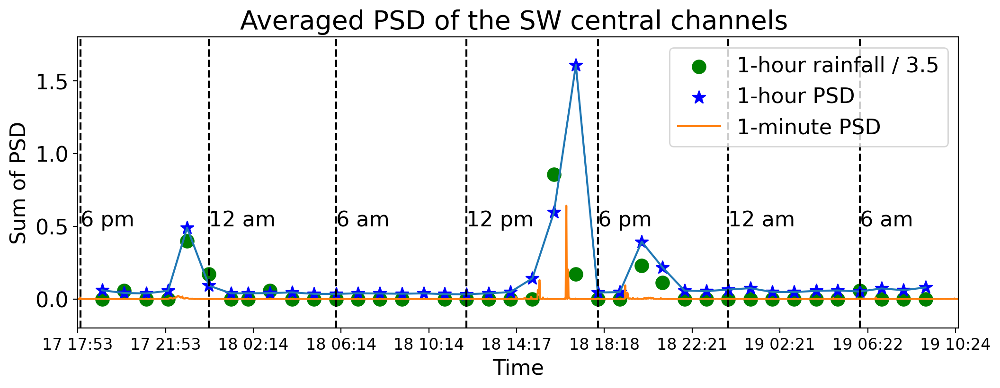

In [9]:
xax=np.arange(0, ave_psd.shape[-1], 240)
tax=acqu_time[:ave_psd.shape[-1]:240]
hrax=[dt.strftime('%d %H:%M') for dt in tax]
plt.figure(figsize = (12, 4), dpi = 200)   
plt.scatter(hourly_index, rain_diff/3.5, label='1-hour rainfall / 3.5', color='g', marker='o', s=100)
plt.scatter(hourly_index, np.array(hr_psd), label='1-hour PSD', color='b', marker='*', s=100)
plt.plot(hourly_index, np.array(hr_psd))
plt.plot(np.arange(ave_psd.shape[-1]), ave_psd, label='1-minute PSD')
plt.xticks(xax, hrax, fontsize = 12)
plt.xlabel("Time", fontsize = 16)
plt.ylabel("Sum of PSD", fontsize = 16)
plt.title('Averaged PSD of the SW central channels ', fontsize = 20)  
plt.ylim(-0.2, 1.8)
plt.xlim(0, ave_psd.shape[-1])
plt.legend()

for it in Ind6hrs:
    plt.axvline(x = it, color = 'k', linestyle='--')
plt.text(Ind6hrs[0], 0.5, '6 pm', color='k')
plt.text(Ind6hrs[1], 0.5, '12 am', color='k')
plt.text(Ind6hrs[2], 0.5, '6 am', color='k')
plt.text(Ind6hrs[3], 0.5, '12 pm', color='k')
plt.text(Ind6hrs[4], 0.5, '6 pm', color='k')
plt.text(Ind6hrs[5], 0.5, '12 am', color='k')
plt.text(Ind6hrs[6], 0.5, '6 am', color='k')

## Temperature

Text(2138, 0.5, '6 am')

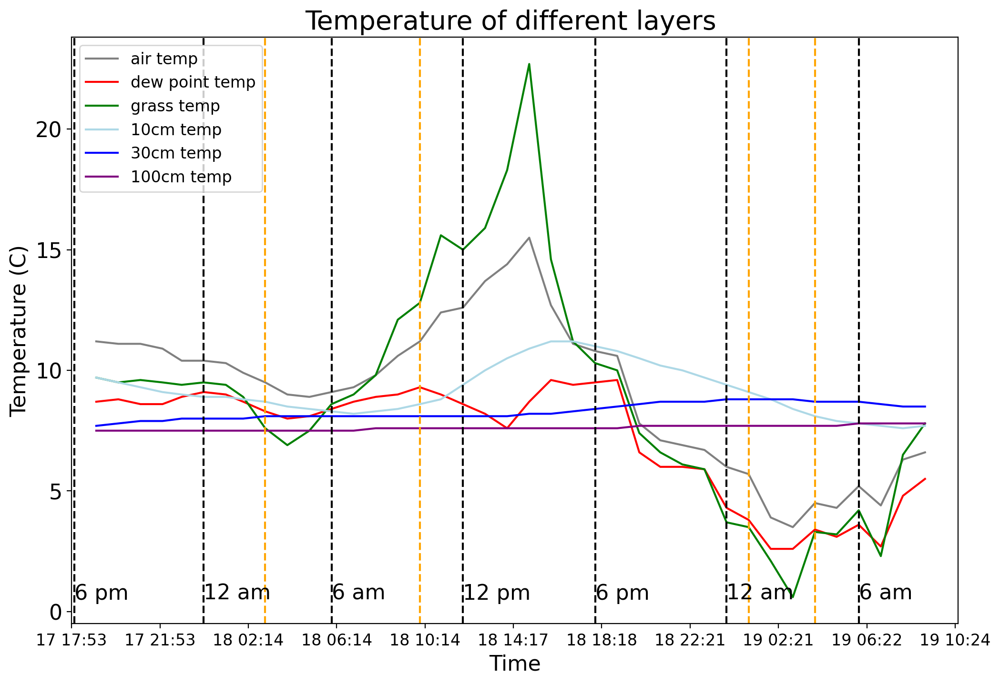

In [10]:
plt.figure(figsize = (12, 8), dpi = 200) 
plt.plot(hourly_index, air_temp, label='air temp', color='gray')
plt.plot(hourly_index, dew_temp, label='dew point temp', color='red')
plt.plot(hourly_index, grs_temp, label='grass temp', color='green')
plt.plot(hourly_index, soil_temp_10, label='10cm temp', color='lightblue')
plt.plot(hourly_index, soil_temp_30, label='30cm temp', color='blue')
plt.plot(hourly_index, soil_temp_100, label='100cm temp', color='purple')
plt.legend(fontsize = 12)
plt.xticks(xax, hrax, fontsize = 12)
plt.xlim(0, ave_psd.shape[-1])
plt.xlabel("Time", fontsize = 16)
plt.ylabel("Temperature (C)", fontsize = 16)
plt.title('Temperature of different layers ', fontsize = 20)  

plt.axvline(x = hourly_index[8], color = 'orange', linestyle='--')
plt.axvline(x = hourly_index[15], color = 'orange', linestyle='--')
plt.axvline(x = hourly_index[30], color = 'orange', linestyle='--')
plt.axvline(x = hourly_index[33], color = 'orange', linestyle='--')


for it in Ind6hrs:
    plt.axvline(x = it, color = 'k', linestyle='--')
plt.text(Ind6hrs[0], 0.5, '6 pm', color='k')
plt.text(Ind6hrs[1], 0.5, '12 am', color='k')
plt.text(Ind6hrs[2], 0.5, '6 am', color='k')
plt.text(Ind6hrs[3], 0.5, '12 pm', color='k')
plt.text(Ind6hrs[4], 0.5, '6 pm', color='k')
plt.text(Ind6hrs[5], 0.5, '12 am', color='k')
plt.text(Ind6hrs[6], 0.5, '6 am', color='k')

# Data --ACF 

### Stretch using mean ACF, and stack for a reference ACF

In [11]:
freqmin=25
freqmax=50
samp_freq = 500
dchan = 3.19
win_st = int(0.012*samp_freq)
stretch_range = np.arange(0.1, 2, 0.01)

In [12]:
with h5py.File('/fd1/QibinShi_data/England_farm/autocorr_'+str(freqmin)+'_'+str(freqmax)+'Hz.hdf5', 'r') as f:
    corr_all_time = f['autocorr'][:, :, 2500:, 0]
    
x=np.arange(corr_all_time.shape[1])
y=np.arange(corr_all_time.shape[2])
xax=np.arange(0, x.shape[-1], 48)
tax=acqu_time[:2410:240]


time = y[win_st:] / samp_freq
stack_stretch=np.zeros((51, len(time)), dtype = np.float32)

for iloc in range(51):
    data_plot=corr_all_time[iloc].T
    trunc_acf = data_plot[win_st:, :]
    trunc_stk = np.mean(trunc_acf, axis=1)
    
    count = 0
#     plt.figure(figsize = (10, 3), dpi = 200)
    for i in x[::5]:
        tmp=np.zeros_like(time)
        stretched, time_new, ratio, cc = stretch(trunc_stk, trunc_acf[:,i], time, min_ratio=0.1, max_ratio=2)
        if cc > 0.5:  # stack
            length=min(len(stretched), len(time))
            tmp[:length]=stretched[:length]
            stack_stretch[iloc, :] += tmp
#             plt.plot(time, tmp)
            count +=1
        else:continue
#     plt.plot(time, stack_stretch[iloc, :]/count, c='k', lw=9, alpha=0.5, label='mean of all')
#     plt.title('channel '+ str(iloc+44)); plt.legend(); plt.xlabel('lag time (s)')

### Two examples: dvv distribution 

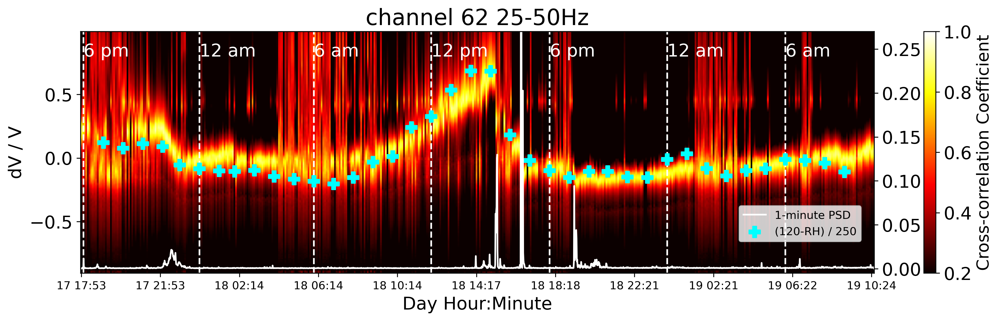

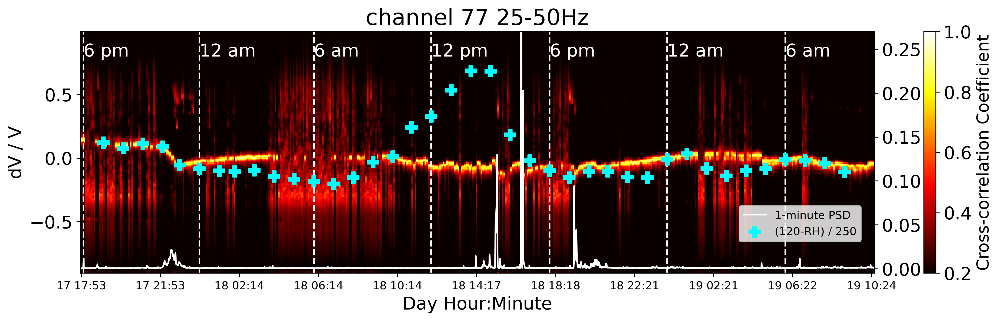

In [13]:
all_cc = np.zeros((51, len(stretch_range), len(x)), dtype = np.float32)

for iloc in [18, 33]:
    data_plot=corr_all_time[iloc].T
    trunc_acf = data_plot[win_st:, :]
    trunc_stk = stack_stretch[iloc, :]/count
    strecthed_acfs = np.zeros_like(trunc_acf)
    for i in x:
        ratios, ccs = stretch_distribution(trunc_stk, trunc_acf[:,i], time, min_ratio=0.1, max_ratio=2)
        all_cc[iloc, :, i] = ccs  
    plt.figure(figsize = (16, 4), dpi = 300)
    plt.pcolormesh(x, stretch_range-1, all_cc[iloc], shading='auto', vmin=0.2, vmax=1, cmap = 'hot')
    plt.xticks(xax, hrax, fontsize = 10)
    plt.xlabel("Day Hour:Minute", fontsize = 16)
    plt.ylabel("dV / V", fontsize = 16)

    plt.title('channel '+ str(iloc+44)+ ' ' + str(freqmin)+'-'+str(freqmax)+'Hz', fontsize = 20)
    bar = plt.colorbar()
    bar.set_label('Cross-correlation Coefficient', fontsize = 15)
    for it in Ind6hrs:
        plt.axvline(x = it/5, color = 'w', linestyle='--')
    plt.text(Ind6hrs[0]/5, 0.8, '6 pm', color='w')
    plt.text(Ind6hrs[1]/5, 0.8, '12 am', color='w')
    plt.text(Ind6hrs[2]/5, 0.8, '6 am', color='w')
    plt.text(Ind6hrs[3]/5, 0.8, '12 pm', color='w')
    plt.text(Ind6hrs[4]/5, 0.8, '6 pm', color='w')
    plt.text(Ind6hrs[5]/5, 0.8, '12 am', color='w')
    plt.text(Ind6hrs[6]/5, 0.8, '6 am', color='w')

    
    axcopy = plt.twinx()
#     axcopy.scatter(np.array(hourly_index)/5, soil_temp_10-7.5, label='T_10cm', color='w', marker='^')
#     axcopy.scatter(np.array(hourly_index)/5, (soil_temp_30-7.5), label='T_30cm', color='w', marker='s')
#     axcopy.scatter(np.array(hourly_index)/5, (soil_temp_100-7.5), label='T_100cm', color='w', marker='v')
    axcopy.scatter(np.array(hourly_index)/5, (120-humidity)/250, label='(120-RH) / 250', color='cyan', marker='P', s=100)
#     axcopy.scatter(np.array(hourly_index)/5, rain_diff/3.5, label='1-hour rainfall', color='g', marker='o', s=100)
#     axcopy.scatter(np.array(hourly_index)/5, np.array(hr_psd), label='1-hour PSD', color='b', marker='*', s=100)
#     axcopy.plot(np.array(hourly_index)/5, np.array(hr_psd))
    axcopy.plot(np.arange(ave_psd.shape[-1])/5, ave_psd, label='1-minute PSD', color='w')
    axcopy.legend(fontsize = 10, loc=(0.83,0.13))
    axcopy.set_ylim(-0.005,0.27)
    plt.savefig('dvv_rain_moisture_ch'+str(iloc)+'.png')

### Enhance all channels and get reference dvv

In [14]:
# 2D space time of dvv
time = y[win_st:win_st+75] / samp_freq

all_dvv = np.zeros((51, len(x)), dtype = np.float32)
all_cc = np.zeros((51, len(stretch_range), len(x)), dtype = np.float32)

for iloc in range(51):
    data_plot=corr_all_time[iloc].T
    trunc_acf = data_plot[win_st:win_st+75, :]
    trunc_stk = stack_stretch[iloc, :75]/count
    strecthed_acfs = np.zeros_like(trunc_acf)
    for i in x:
        ratios, ccs = stretch_distribution(trunc_stk, trunc_acf[:,i], time, min_ratio=0.1, max_ratio=2)
        all_cc[iloc, :, i] = ccs 
        
    ######################
    ## Denoising
    # %% Use cone-filter
    filt_data, filtered_fk, fk2d = fk_filter_2cones(all_cc[iloc].T, w1=0.03, w2=0.005, cone1=True, cone2=False)
    image = filt_data.real.T[:,:]
    image = image - np.nanmin(image)
    denoised_image = gaussian_filter(image, sigma=1)
    #######################
    dvv_ind = np.argmax(denoised_image, axis=0)
    for i in range(len(dvv_ind)):
        all_dvv[iloc, i]= stretch_range[dvv_ind[i]]
    # cc_dvv = np.nanmax(denoised_image, axis=0)
    ######################


# Method 1 to set bounds for dvv

### Refine dvv bounds using the reference dvv

In [15]:
# Search dvv again using find_peaks and based on the 1st-round dvv  
time = y[win_st:] / samp_freq
stretch_range = np.arange(0.1, 2, 0.01)

new_dvv = np.zeros((51, len(x)), dtype = np.float32)
new_cc = np.zeros((51, len(stretch_range), len(x)), dtype = np.float32)
cc_dvv = np.zeros((51, len(x)), dtype = np.float32)
peaks = np.zeros((51, len(x)), dtype=np.float32)


xax=np.arange(0, x.shape[-1], 48)
tax=acqu_time[:2410:240]

for iloc in np.arange(0,50,1):
    data_plot=corr_all_time[iloc].T
    trunc_acf = data_plot[win_st:, :]
    trunc_stk = stack_stretch[iloc, :]/count
    strecthed_acfs = np.zeros_like(trunc_acf)
    for i in x:
        ratios, ccs = stretch_distribution(trunc_stk, trunc_acf[:,i], time, min_ratio=0.1, max_ratio=2)
        new_cc[iloc, :, i] = ccs 
        
    ######################
    ## Denoising
    # %% Use cone-filter
    filt_data, filtered_fk, fk2d = fk_filter_2cones(new_cc[iloc].T, w1=0.03, w2=0.005, cone1=True, cone2=False)
    image = filt_data.real.T[:,:]
    image = image - np.nanmin(image)
    denoised_image = gaussian_filter(image, sigma=2)
    
    #######################
    ## set bounds using 1st round dvv
    upper = int(np.percentile(all_dvv[iloc], 99) / 0.01 + 10)
    lower = int(np.percentile(all_dvv[iloc],  1) / 0.01 - 10)
    dvv_ind = np.argmax(denoised_image[lower:upper, :], axis=0) + lower

    
    for i in range(len(dvv_ind)):
        new_dvv[iloc, i]= stretch_range[dvv_ind[i]]
        peak_ind, _ = find_peaks(denoised_image[lower:upper, i], prominence=0.003, height=0.35)
        if len(peak_ind) > 0:
            peaks[iloc,i] = stretch_range[peak_ind[-1]+lower]
            cc_dvv[iloc,i] = denoised_image[peak_ind[-1]+lower, i]
        else: 
            peaks[iloc,i] = stretch_range[dvv_ind[i]]
            cc_dvv[iloc,i] = denoised_image[dvv_ind[i], i]   

NFFT=8192 samples, equivalent to 81.92 seconds
saturated for period > 40.96 seconds


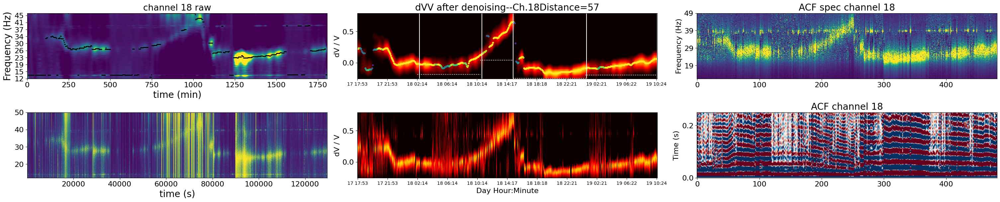

In [208]:
# Search dvv again using find_peaks and based on the 1st-round dvv  
time = y[win_st:] / samp_freq
stretch_range = np.arange(0.75, 1.8, 0.01)

new_cc = np.zeros((51, len(stretch_range), len(x)), dtype = np.float32)
cc_dvv = np.zeros((51, len(x)), dtype = np.float32)
new_peaks = np.zeros((51, len(x)), dtype=np.float32)


xax=np.arange(0, x.shape[-1], 48)
tax=acqu_time[:2410:240]

nfft, time_width = calc_NFFT(full_time_data[33], sample_rate, power_of_2=True)
print(f'saturated for period > {time_width/2} seconds')

for iloc in np.arange(18,20,6):

    fig, ax = plt.subplots(2, 3, figsize=(30, 6), constrained_layout=True)

    ############################################################################################################ Spectrogram
    # %% calculate the best NFFT for plotting
 
    Pxx, freqs, bins, image = ax[1,0].specgram(full_time_data[iloc], Fs=sample_rate,
                                    mode='magnitude',NFFT=nfft,noverlap=int(nfft/8), 
                                    scale='linear', vmin=0, vmax=0.01)
    ax[1,0].set_xlabel("time (s)", fontsize = 20)
    ax[1,0].set_ylim(12, 50)

    ######################
    ## Denoising
    filtered_image = Pxx[1000:]
    freqs1 = freqs[1000:]

    ##### iterations
    for i in range(4):
        filt_data, filtered_fk, fk2d = fk_filter_2cones(filtered_image.T, w1=0.001*(i+1), w2=0.005, cone1=True, cone2=False)
        image = filt_data.real.T
        image = image - np.nanmin(image)
        filtered_image = scipy.ndimage.gaussian_filter(image, sigma=i+2)

    filtered_image = filtered_image[:-300]
    freqs1 = freqs1[:-300]

    q1=np.percentile(filtered_image, q=25)
    q2=np.percentile(filtered_image, q=99)
    ax[0,0].imshow(filtered_image, aspect='auto', cmap='viridis', origin='lower', vmax=q2, vmin=q1)
    ax[0,0].set_yticks(np.arange(0, 2701, 300))
    ax[0,0].set_yticklabels(freqs1[::300].astype(int))

    Pxx1 = filtered_image
    freq_ind1 = np.argmax(Pxx1, axis=0)

    ax[0,0].scatter(np.arange(1807), freq_ind1, marker='o', s=1, edgecolors='k')
    ax[0,0].set_xlabel("time (min)", fontsize = 20)
    ax[0,0].set_ylabel("Peak-PSD frequency (Hz)", fontsize = 20)
    ax[0,0].set_ylabel("Frequency (Hz)", fontsize = 20)
    ax[0,0].set_title(f'channel {iloc} denoised')
    ax[0,0].set_title(f'channel {iloc} raw')


    ############################################################################################################ stretching for dv


    data_plot=corr_all_time[iloc].T
    trunc_acf = data_plot[win_st:, :]
    trunc_stk = stack_stretch[iloc, :]/count
    strecthed_acfs = np.zeros_like(trunc_acf)
    for i in x:
        ratios, ccs = stretch_distribution(trunc_stk, trunc_acf[:,i], time, min_ratio=0.75, max_ratio=1.80)
        new_cc[iloc, :, i] = ccs 
        
    ######################
    ## Denoising
    # %% Use cone-filter
    filt_data, filtered_fk, fk2d = fk_filter_2cones(new_cc[iloc].T, w1=0.03, w2=0.005, cone1=True, cone2=False)
    image = filt_data.real.T[:,:]
    image = image - np.nanmin(image)
    denoised_image = gaussian_filter(image, sigma=2)
    
    ax[0,1].pcolormesh(x, stretch_range-1, denoised_image, shading='auto', vmin=0.3, vmax=1, cmap='hot')
    ax[0,1].set_xticks(xax)
    ax[0,1].set_xticklabels(hrax, fontsize = 10)
    ######################



    ############################################################################################################ multi-segment bounds
    dvv_ind = np.zeros(len(x), dtype=np.int32)
    #####################################################################
    jump_point = 1
    for percent in [80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5]:
        jump = np.percentile(peaks[iloc,0:100], percent) - np.percentile(peaks[iloc,0:100], percent-5)
        if jump > 0.2:
            jump_point = percent
    
    ## set bounds using 1st round dvv
    upper = int(np.percentile(peaks[iloc,0:100], 99) / 0.01 -70 )
    lower = max(int(np.percentile(peaks[iloc,0:100],  jump_point) / 0.01 - 85), 0)
    dvv_ind[0:100] = np.argmax(denoised_image[lower:upper, 0:100], axis=0) + lower
    
    for i in np.arange(0,100):
        peak_ind, _ = find_peaks(denoised_image[lower:upper, i], prominence=0.003, height=0.35)
        if len(peak_ind) > 0:
            new_peaks[iloc,i] = stretch_range[peak_ind[-1]+lower]
            cc_dvv[iloc,i] = denoised_image[peak_ind[-1]+lower, i]
        else: 
            new_peaks[iloc,i] = stretch_range[dvv_ind[i]]
            cc_dvv[iloc,i] = denoised_image[dvv_ind[i], i]   
    
    ax[0,1].hlines(y=stretch_range[lower]-1, color='w', linestyle='dotted', xmin=0, xmax=0.2)
     #####################################################################
    jump_point = 1
    for percent in [80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5]:
        jump = np.percentile(peaks[iloc,100:200], percent) - np.percentile(peaks[iloc,100:200], percent-5)
        if jump > 0.1:
            jump_point = percent
    
    ## set bounds using 1st round dvv
    upper = int(np.percentile(peaks[iloc,100:200], 99) / 0.01 -70)
    lower = max(int(np.percentile(peaks[iloc,100:200],  jump_point) / 0.01 - 85), 0)
    dvv_ind[100:200] = np.argmax(denoised_image[lower:upper, 100:200], axis=0) + lower
    
    for i in np.arange(100,200):
        peak_ind, _ = find_peaks(denoised_image[lower:upper, i], prominence=0.003, height=0.35)
        if len(peak_ind) > 0:
            new_peaks[iloc,i] = stretch_range[peak_ind[-1]+lower]
            cc_dvv[iloc,i] = denoised_image[peak_ind[-1]+lower, i]
        else: 
            new_peaks[iloc,i] = stretch_range[dvv_ind[i]]
            cc_dvv[iloc,i] = denoised_image[dvv_ind[i], i]   
            
    ax[0,1].axhline(y=stretch_range[lower]-1, color='w', linestyle='dotted', xmin=0.2, xmax=0.41)
    #####################################################################
    jump_point = 1
    for percent in [80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5]:
        jump = np.percentile(peaks[iloc,200:250], percent) - np.percentile(peaks[iloc,200:250], percent-5)
        if jump > 0.2:
            jump_point = percent
    
    ## set bounds using 1st round dvv
    upper = int(np.percentile(peaks[iloc,200:250], 99) / 0.01 -70)
    lower = max(int(np.percentile(peaks[iloc,200:250],  jump_point) / 0.01 - 85), 0)
    dvv_ind[200:250] = np.argmax(denoised_image[lower:upper, 200:250], axis=0) + lower
    
    for i in np.arange(200,250):
        peak_ind, _ = find_peaks(denoised_image[lower:upper, i], prominence=0.003, height=0.35)
        if len(peak_ind) > 0:
            new_peaks[iloc,i] = stretch_range[peak_ind[-1]+lower]
            cc_dvv[iloc,i] = denoised_image[peak_ind[-1]+lower, i]
        else: 
            new_peaks[iloc,i] = stretch_range[dvv_ind[i]]
            cc_dvv[iloc,i] = denoised_image[dvv_ind[i], i]   
            
    ax[0,1].axhline(y=stretch_range[lower]-1, color='w', linestyle='dotted', xmin=0.41, xmax=0.52)
     #####################################################################
    jump_point = 1
    for percent in [80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5]:
        jump = np.percentile(peaks[iloc,250:368], percent) - np.percentile(peaks[iloc,250:368], percent-5)
        if jump > 0.15:
            jump_point = percent
    
    ## set bounds using 1st round dvv
    upper = int(np.percentile(peaks[iloc,250:368], 99) / 0.01 -70)
    lower = max(int(np.percentile(peaks[iloc,250:368],  jump_point) / 0.01 - 85), 0)
    dvv_ind[250:368] = np.argmax(denoised_image[lower:upper, 250:368], axis=0) + lower
    
    for i in np.arange(250,368):
        peak_ind, _ = find_peaks(denoised_image[lower:upper, i], prominence=0.003, height=0.35)
        if len(peak_ind) > 0:
            new_peaks[iloc,i] = stretch_range[peak_ind[-1]+lower]
            cc_dvv[iloc,i] = denoised_image[peak_ind[-1]+lower, i]
        else: 
            new_peaks[iloc,i] = stretch_range[dvv_ind[i]]
            cc_dvv[iloc,i] = denoised_image[dvv_ind[i], i]   
            
    ax[0,1].axhline(y=stretch_range[lower]-1, color='w', linestyle='dotted', xmin=0.52, xmax=0.76)
     #####################################################################
    jump_point = 1
    for percent in [80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5]:
        jump = np.percentile(peaks[iloc,368:], percent) - np.percentile(peaks[iloc,368:], percent-5)
        if jump > 0.2:
            jump_point = percent
    
    ## set bounds using 1st round dvv
    upper = int(np.percentile(peaks[iloc,368:], 99) / 0.01 -70)
    lower = max(int(np.percentile(peaks[iloc,368:],  jump_point) / 0.01 - 85), 0)
    dvv_ind[368:] = np.argmax(denoised_image[lower:upper, 368:], axis=0) + lower
    
    for i in np.arange(368,len(x)):
        peak_ind, _ = find_peaks(denoised_image[lower:upper, i], prominence=0.003, height=0.35)
        if len(peak_ind) > 0:
            new_peaks[iloc,i] = stretch_range[peak_ind[-1]+lower]
            cc_dvv[iloc,i] = denoised_image[peak_ind[-1]+lower, i]
        else: 
            new_peaks[iloc,i] = stretch_range[dvv_ind[i]]
            cc_dvv[iloc,i] = denoised_image[dvv_ind[i], i]   
            
    ax[0,1].axhline(y=stretch_range[lower]-1, color='w', linestyle='dotted', xmin=0.76)
    #####################################################################
    
    
    
    #######################
    ax[0,1].scatter(x, new_peaks[iloc]-1, cmap='viridis', c=cc_dvv[iloc], s=10, marker='o', vmin=0.3, vmax=0.5)
    ax[0,1].set_xticks(xax)
    ax[0,1].set_xticklabels(hrax, fontsize = 10)
    ax[0,1].set_title('dVV after denoising--Ch.'+str(iloc)+'Distance='+str(int(iloc*dchan)), fontsize=20)
    ax[0,1].set_xlim(0, x.shape[-1])
    ax[0,1].set_ylabel("dV / V", fontsize = 16)
    
    ax[0,1].axvline(x = 100, color = 'w', linestyle='-')
    ax[0,1].axvline(x = 200, color = 'w', linestyle='-')
    ax[0,1].axvline(x = 250, color = 'w', linestyle='-')
    ax[0,1].axvline(x = 368, color = 'w', linestyle='-')


        
    ### Raw image of dvv likelihood
    ax[1,1].pcolormesh(x, stretch_range-1, new_cc[iloc], shading='auto', vmin=0.3, vmax=1.0, cmap = 'hot')
    ax[1,1].set_xticks(xax)
    ax[1,1].set_xticklabels(hrax, fontsize = 10)
    ax[1,1].set_xlabel("Day Hour:Minute", fontsize = 16)
    ax[1,1].set_ylabel("dV / V", fontsize = 16)



    ############################################################################################################
    time_steps = data_plot.shape[0]

    # Compute FFT along the time dimension
    fft_data = np.fft.fft(data_plot, axis=0)  # FFT along time
    frequencies = np.fft.fftfreq(time_steps, d=1/samp_freq)   # Frequency axis

    # Take magnitude (or power)
    magnitude_spectrum = np.abs(fft_data)

    # Keep only the positive frequencies (FFT is symmetric)
    half_idx = time_steps // 2
    magnitude_spectrum = magnitude_spectrum[:half_idx, :]
    frequencies = frequencies[:half_idx]
    q1 = np.percentile(magnitude_spectrum, q=25)
    q2 = np.percentile(magnitude_spectrum, q=99)
    q3 = np.percentile(np.abs(data_plot), q=90)

    ax[1,2].imshow(data_plot, aspect='auto', cmap='RdBu', origin='lower', vmin=-q3, vmax=q3)
    ax[1,2].set_yticks(np.arange(0, time_steps, 100))
    ax[1,2].set_yticklabels(np.arange(0, time_steps, 100)/samp_freq)
    ax[1,2].set_ylim(0, time_steps/20)
    ax[1,2].set_title('ACF channel '+ str(iloc), fontsize = 20)
    ax[1,2].set_ylabel("Time (s)", fontsize = 16)
    ax[0,2].imshow(magnitude_spectrum, aspect='auto', cmap='viridis', origin='lower', vmin=q1, vmax=q2)
    ax[0,2].set_yticks(np.arange(0, half_idx, 50))
    ax[0,2].set_yticklabels(frequencies[::50].astype(int))
    ax[0,2].set_ylim(half_idx/20, half_idx/5)
    ax[0,2].set_ylabel("Frequency (Hz)", fontsize = 16)
    ax[0,2].set_title('ACF spec channel '+ str(iloc), fontsize = 20)


# Method 2: enhance dvv by correlating with ACF spectra

In [16]:
def peak_dvv(new_peaks, ax, thrs=0.3):
    f = interp1d(np.nonzero(new_peaks>0)[0], new_peaks[new_peaks>0], bounds_error=False, fill_value="extrapolate", kind='linear')
    new_peaks_iloc = f(np.arange(len(new_peaks)))
    grad_iloc = np.abs(np.diff(new_peaks_iloc))
    grad_peaks_iloc, _ = find_peaks(grad_iloc, prominence=0.05)
    grad_peaks_iloc += 1
    preserve_inds = [np.arange(50, 60), np.arange(201, 299)]
    for (ini, iend) in [[0, 50], [60, 201], [299, len(new_peaks_iloc)]]:
        grad_peaks_interval = grad_peaks_iloc[(grad_peaks_iloc > ini) & (grad_peaks_iloc < iend)]-ini
        if len(grad_peaks_interval) <= 1:
            continue
        data_segs = np.split(new_peaks_iloc[ini:iend], grad_peaks_interval)
        # print('Len of segments'+str([len(seg) for seg in data_segs]))
        ind_segs = np.split(np.arange(ini, iend), grad_peaks_interval)
        for i in range(len(data_segs)):
            if len(data_segs[i]) < 3:
                continue
            if np.abs(data_segs[i][0]-np.mean(data_segs[i][1:])) > 0.1:
                data_segs[i] = data_segs[i][1:]
                ind_segs[i] = ind_segs[i][1:]
            if np.abs(data_segs[i][-1]-np.mean(data_segs[i][:-1])) > 0.1:
                data_segs[i] = data_segs[i][:-1]
                ind_segs[i] = ind_segs[i][:-1]
        ref_seg_id = np.argmax([len(seg) for seg in data_segs])
        mean_segs = np.array([np.mean(seg) for seg in data_segs])
        preserve_seg_id = [ref_seg_id]
        num_iter = 0
        while True:
    
            coefficients = np.polyfit(np.hstack([ind_segs[i] for i in preserve_seg_id]), 
                np.hstack([data_segs[i] for i in preserve_seg_id]), 1)
            polynomial = np.poly1d(coefficients)
            mean_distance = np.array([np.sqrt(np.mean(np.square(polynomial(ind_segs[i])-data_segs[i]))) for i in range(len(data_segs))])

            # combine nearby segments
            if num_iter == 0:
                combine_ids = np.argsort(mean_distance)[:2]
                # print(combine_ids)
            else:
                combine_ids = np.nonzero(mean_distance < thrs * (np.amax(mean_segs)-np.amin(mean_segs)))[0]
    
            
            if len(combine_ids) == len(preserve_seg_id):
                break
            preserve_seg_id = combine_ids
            num_iter += 1
        preserve_inds.extend([ind_segs[i] for i in preserve_seg_id])
        # ax.plot(np.arange(ini, iend), polynomial(np.arange(ini, iend)), 'g')
    # interpolate
    preserve_inds = np.hstack(preserve_inds)
    f = interp1d(preserve_inds, new_peaks_iloc[preserve_inds], bounds_error=False, fill_value="extrapolate", kind='linear')
    new_peaks_iloc[:] = f(np.arange(len(new_peaks_iloc)))

    ### remove scatter points 
    # while True:
    pks, _ = find_peaks(np.abs(np.diff(new_peaks_iloc)), prominence=1)
    # if len(pks) == 0:
    #     break
    
    seg_inds = np.split(np.arange(len(new_peaks_iloc)), pks+1)
    valid_id = []
    for _ in seg_inds:
        if len(_) > 5:
            valid_id.extend(_)
    # if len(valid_id) == len(new_peaks_iloc):
    #     break
    f = interp1d(valid_id, new_peaks_iloc[valid_id], bounds_error=False, fill_value="extrapolate", kind='linear')
    new_peaks_iloc[:] = f(np.arange(len(new_peaks_iloc)))

    
    ax.plot(x[1:], np.abs(np.diff(new_peaks_iloc))*10, 'purple')
    
    ax.plot(x, new_peaks_iloc, 'g')

    return new_peaks_iloc

In [17]:
def multi_bounds(iloc, peaks, input_image, ax, cc_dvv, new_peaks):
    
    dvv_ind = np.zeros(len(x), dtype=np.int32)

    #####################################################################1
    jump_point = 1
    for percent in [80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5]:
        jump = np.percentile(peaks[iloc,0:100], percent) - np.percentile(peaks[iloc,0:100], percent-5)
        if jump > 0.2:
            jump_point = percent
    
    upper = int(np.percentile(peaks[iloc,0:100], 99) / 0.01 - 75)
    lower = int(np.percentile(peaks[iloc,0:100], jump_point) / 0.01 - 85)
    upper = max(upper, 40)
    lower = max(lower, 0)
    
    dvv_ind[0:100] = np.argmax(input_image[lower:upper, 0:100], axis=0) + lower
    
    for i in np.arange(0,100):
        new_peaks[iloc,i] = stretch_range[dvv_ind[i]]
        cc_dvv[iloc,i] = input_image[dvv_ind[i], i]  
        
    ax.hlines(y=lower, color='w', linestyle='dotted', xmin=0, xmax=0.2)
    ax.hlines(y=upper, color='k', linestyle='dotted', xmin=0, xmax=0.2)
     #####################################################################2
    jump_point = 1
    for percent in [80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5]:
        jump = np.percentile(peaks[iloc,100:170], percent) - np.percentile(peaks[iloc,100:170], percent-5)
        if jump > 0.1:
            jump_point = percent
    
    ## set bounds using 1st round dvv
    upper = int(np.percentile(peaks[iloc,100:170], 99) / 0.01 - 75)
    lower = int(np.percentile(peaks[iloc,100:170],  jump_point) / 0.01 - 85)
    upper = max(upper, 40)
    lower = max(lower, 0)    

    dvv_ind[100:170] = np.argmax(input_image[lower:upper, 100:170], axis=0) + lower
    
    for i in np.arange(100,170):
        new_peaks[iloc,i] = stretch_range[dvv_ind[i]]
        cc_dvv[iloc,i] = input_image[dvv_ind[i], i]   
            
    ax.axhline(y=lower, color='w', linestyle='dotted', xmin=0.2, xmax=0.35)
    ax.axhline(y=upper, color='k', linestyle='dotted', xmin=0.2, xmax=0.35)
    #####################################################################3
    jump_point = 1
    for percent in [80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5]:
        jump = np.percentile(peaks[iloc,170:250], percent) - np.percentile(peaks[iloc,170:250], percent-5)
        if jump > 0.2:
            jump_point = percent
    
    ## set bounds using 1st round dvv
    upper = int(np.percentile(peaks[iloc,170:250], 99) / 0.01 - 75)
    lower = int(np.percentile(peaks[iloc,170:250],  jump_point) / 0.01 - 85)
    upper = max(upper, 40)
    lower = max(lower, 0)
    dvv_ind[170:250] = np.argmax(input_image[lower:upper, 170:250], axis=0) + lower
    
    for i in np.arange(170,250):
        new_peaks[iloc,i] = stretch_range[dvv_ind[i]]
        cc_dvv[iloc,i] = input_image[dvv_ind[i], i]   
            
    ax.axhline(y=lower, color='w', linestyle='dotted', xmin=0.35, xmax=0.52)
    ax.axhline(y=upper, color='k', linestyle='dotted', xmin=0.35, xmax=0.52)
    #####################################################################4
    jump_point = 1
    for percent in [80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5]:
        jump = np.percentile(peaks[iloc,250:368], percent) - np.percentile(peaks[iloc,250:368], percent-5)
        if jump > 0.15:
            jump_point = percent
    
    ## set bounds using 1st round dvv
    upper = int(np.percentile(peaks[iloc,250:368], 99) / 0.01 - 75)
    lower = int(np.percentile(peaks[iloc,250:368],  jump_point) / 0.01 - 85)
    upper = max(upper, 40)
    lower = max(lower, 0)
    dvv_ind[250:368] = np.argmax(input_image[lower:upper, 250:368], axis=0) + lower
    
    for i in np.arange(250,368):
        new_peaks[iloc,i] = stretch_range[dvv_ind[i]]
        cc_dvv[iloc,i] = input_image[dvv_ind[i], i]   
            
    ax.axhline(y=lower, color='w', linestyle='dotted', xmin=0.52, xmax=0.76)
    ax.axhline(y=upper, color='k', linestyle='dotted', xmin=0.52, xmax=0.76)
     #####################################################################5
    jump_point = 1
    for percent in [80,75,70,65,60,55,50,45,40,35,30,25,20,15,10,5]:
        jump = np.percentile(peaks[iloc,368:], percent) - np.percentile(peaks[iloc,368:], percent-5)
        if jump > 0.2:
            jump_point = percent
    
    ## set bounds using 1st round dvv
    upper = int(np.percentile(peaks[iloc,368:], 99) / 0.01 - 75)
    lower = int(np.percentile(peaks[iloc,368:],  jump_point) / 0.01 - 85)
    upper = max(upper, 40)
    lower = max(lower, 0)
    dvv_ind[368:] = np.argmax(input_image[lower:upper, 368:], axis=0) + lower
    
    for i in np.arange(368,len(x)):
        new_peaks[iloc,i] = stretch_range[dvv_ind[i]]
        cc_dvv[iloc,i] = input_image[dvv_ind[i], i]   
            
    ax.axhline(y=lower, color='w', linestyle='dotted', xmin=0.76)
    ax.axhline(y=upper, color='k', linestyle='dotted', xmin=0.76)
    #####################################################################
    ax.scatter(x, new_peaks[iloc] / 0.01 - 75, cmap='viridis', c=cc_dvv[iloc], s=10, marker='o', vmin=0.3, vmax=0.5)

    return new_peaks[iloc]  / 0.01 -75  
    

In [21]:
# threshold_all = [
#     [0,  0.3], [1,  0.3], [2,  0.3],  [3, 0.3],  [4, 0.3],  [5, 0.3],  [6, 0.3],  [7, 0.3],  [8, 0.6],  [9, 0.6],
#     [10, 1.0], [11, 1.0], [12, 1.0], [13, 1.0], [14, 1.0], [15, 0.4], [16, 0.4], [17, 0.4], [18, 0.4], [19, 0.4], 
#     [20, 0.3], [21, 0.3], [22, 0.3], [23, 0.3], [24, 0.3], [25, 0.5], [26, 0.3], [27, 0.3], [28, 0.3], [29, 0.3],
#     [30, 0.3], [31, 0.3], [32, 0.5], [33, 0.3], [34, 0.3], [35, 0.3], [36, 0.3], [37, 0.3], [38, 0.3], [39, 0.3], 
#     [40, 0.3], [41, 0.3], [42, 0.3], [43, 0.3], [44, 0.3], [45, 0.3], [46, 0.3], [47, 0.3], [48, 0.3], [49, 0.3], 
#     [50, 0.3]
# ]

threshold_all = [
    [0,  0.3, 0], [1,  0.3, 0], [2,  0.3, 0], [3,  0.3, 0], [4,  0.3, 0], [5,  0.3, 0], [6,  0.3, 0], [7,  0.3, 0], [8,  0.6, 0], [9,  0.6, 0],
    [10, 1.0, 1], [11, 1.0, 0], [12, 1.0, 2], [13, 1.0, 2], [14, 1.0, 0], [15, 0.4, 0], [16, 0.4, 0], [17, 0.4, 0], [18, 0.4, 2], [19, 0.4, 0], 
    [20, 0.3, 0], [21, 0.3, 0], [22, 0.3, 0], [23, 0.3, 1], [24, 0.3, 0], [25, 0.5, 1], [26, 0.3, 2], [27, 0.3, 2], [28, 0.3, 0], [29, 0.3, 0],
    [30, 0.3, 0], [31, 0.3, 0], [32, 0.5, 2], [33, 0.3, 0], [34, 0.3, 0], [35, 0.3, 2], [36, 0.3, 0], [37, 0.3, 0], [38, 0.3, 0], [39, 0.3, 0], 
    [40, 0.3, 0], [41, 0.3, 0], [42, 0.3, 0], [43, 0.3, 0], [44, 0.3, 1], [45, 0.3, 1], [46, 0.3, 1], [47, 0.3, 0], [48, 0.3, 0], [49, 0.3, 0]
]

nfft, time_width = calc_NFFT(full_time_data[33], sample_rate, power_of_2=True)
print(f'saturated for period > {time_width/2} seconds')

NFFT=8192 samples, equivalent to 81.92 seconds
saturated for period > 40.96 seconds


  2%|▏         | 1/50 [00:31<25:19, 31.02s/it]/tmp/ipykernel_830090/3856497396.py:30: RankWarning: Polyfit may be poorly conditioned
  coefficients = np.polyfit(np.hstack([ind_segs[i] for i in preserve_seg_id]),
 20%|██        | 10/50 [05:22<21:34, 32.36s/it]/tmp/ipykernel_830090/2216396027.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1,4, figsize=(15, 1))
100%|██████████| 50/50 [26:59<00:00, 32.39s/it]


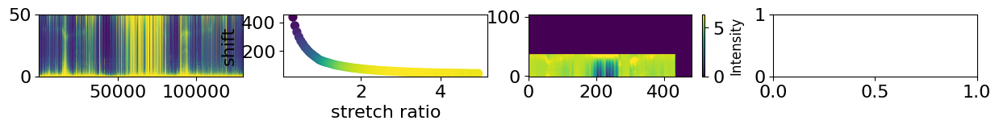

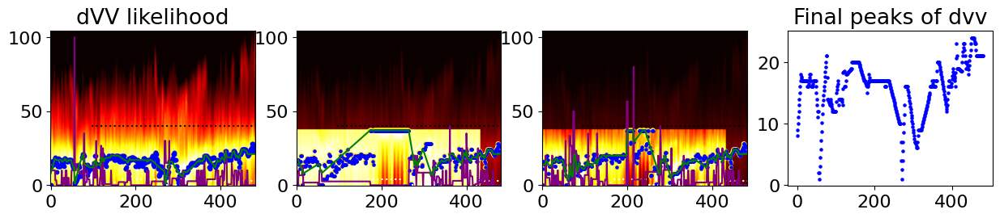

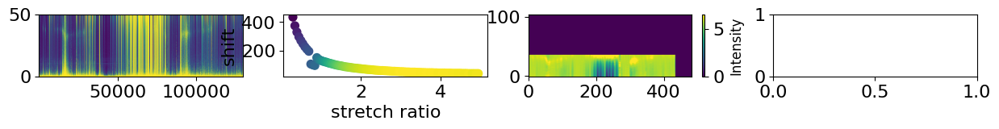

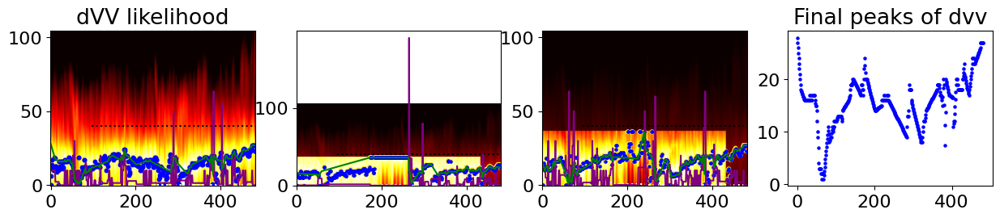

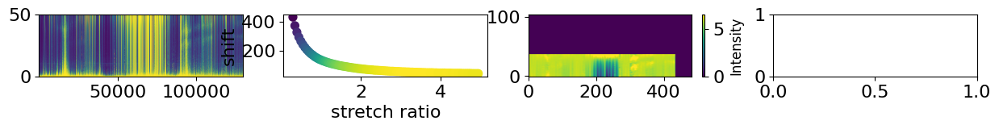

...

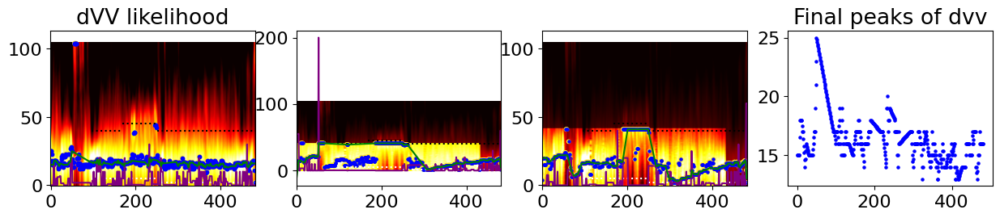

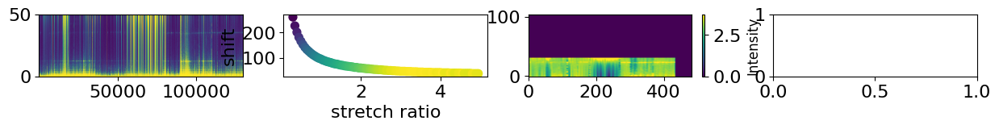

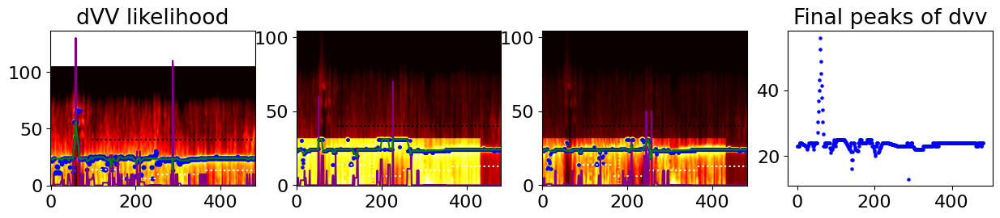

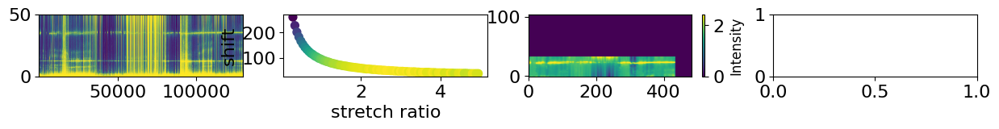

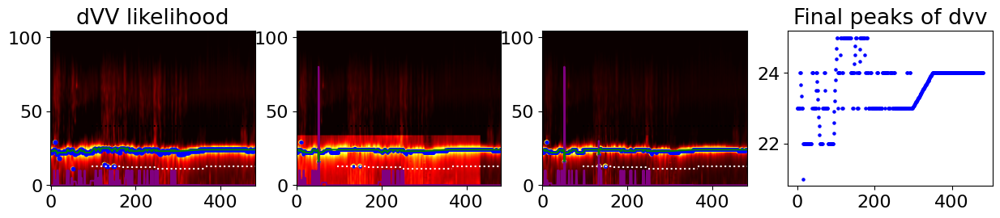

In [ ]:
time = y[win_st:] / samp_freq
new_cc = np.zeros((51, 105, len(x)), dtype = np.float32)
cc_dvv = np.zeros((51, len(x)), dtype = np.float32)
new_peaks = np.zeros((51, len(x)), dtype=np.float32)
final_peaks = np.zeros((51, len(x)), dtype=np.float32)
stretch_range = np.arange(0.75, 1.8, 0.01)

for iloc, thrshold, choice in tqdm(threshold_all[0:50:1]):

    ######################  Prepare dvv likelihood
    ## slice ACF for a channel, roughly a plot
    data_plot=corr_all_time[iloc].T  # shape (corr lag time, time window number)
    trunc_acf = data_plot[win_st:, :]  # cut out primary phase for stretching
    trunc_stk = stack_stretch[iloc, :] / count  # Reference stack ACF
    
    for i in x:  ## stretch for dvv likelihood
        ratios, ccs = stretch_distribution(trunc_stk, trunc_acf[:,i], time, min_ratio=0.75, max_ratio=1.8)
        new_cc[iloc, :, i] = ccs 
        
    ## Denoise dvv likelihood
    filt_data, filtered_fk, fk2d = fk_filter_2cones(new_cc[iloc].T, w1=0.03, w2=0.005, cone1=True, cone2=False)
    image = filt_data.real.T[:,:]  # only real part
    dvv_image = gaussian_filter(image, sigma=1)
    dvv_image = dvv_image / np.std(dvv_image)

    ######################  Prepare ACF spectra
    decimate_data = scipy.signal.decimate(data_plot, 5, axis=0)
    time_steps = decimate_data.shape[0]
    half_idx = time_steps // 2  # FFT is symmetric

    fft_data = np.fft.fft(decimate_data, axis=0)  # FFT along time
    frequencies = np.fft.fftfreq(time_steps, d=5/samp_freq)[:half_idx]
    acf_spec = np.abs(fft_data)[:half_idx, :]    # Take positive part
    acf_spec = gaussian_filter((acf_spec - np.nanmin(acf_spec)), sigma=1)

    ######################  correlate the two
    compress_range = np.arange(0.3, 5, 0.05)  # compress range for acf spec
    strecth_corr = np.zeros((len(compress_range), 2), dtype=np.float32)

    for i, scale in enumerate(compress_range):
        zoom_spec = scipy.ndimage.zoom(acf_spec, (1.0/scale, 1))
        correlate_result = np.zeros((dvv_image.shape[0]+zoom_spec.shape[0]-1, dvv_image.shape[1]), dtype=np.float32)

        for c in range(dvv_image.shape[1]):
            n1 = np.sum(np.square(dvv_image[:,c]))
            n2 = np.sum(np.square(zoom_spec[:,c]))
            correlate_result[:, c] = sgn.correlate(dvv_image[:,c], zoom_spec[:,c]) / np.sqrt(n1 * n2)
            
        strecth_corr[i, 0] = np.argmax(np.mean(correlate_result, axis=1)) + 1
        strecth_corr[i, 1] = np.nanmax(np.mean(correlate_result, axis=1))

    best_scale = compress_range[np.argmax(strecth_corr[:,1])]
    best_shift = strecth_corr[np.argmax(strecth_corr[:,1]), 0]
    zoom_spec_best = scipy.ndimage.zoom(acf_spec, (1.0/best_scale, 1))
    zoom_freq = np.fft.fftfreq(zoom_spec_best.shape[0]*2, d=5/samp_freq)[:zoom_spec_best.shape[0]]

    ## find frequency edges matching stretching edges after stretching and shift
    res_freq_ind = int(zoom_spec_best.shape[0] - best_shift)
    if res_freq_ind >= 0:
        res_freq = zoom_freq[res_freq_ind]
    else:
        res_freq = 0 - zoom_freq[0-res_freq_ind]
    top_freq = res_freq + 105 * (zoom_freq[1] - zoom_freq[0])

    ######################  Prepare noise spec
    fig, ax = plt.subplots(1,4, figsize=(15, 1))
    Pxx, freqs, bins, image = ax[0].specgram(full_time_data[iloc], Fs=sample_rate,
                                    mode='magnitude',NFFT=nfft,noverlap=int(nfft/8), 
                                    scale='linear', vmin=0, vmax=0.01)
    ## Denoise noise spec
    filtered_image = Pxx[1000:]
    freqs1 = freqs[1000:]
    for i in range(4):
        filt_data, filtered_fk, fk2d = fk_filter_2cones(filtered_image.T, w1=0.001*(i+1), w2=0.005, cone1=True, cone2=False)
        image = filt_data.real.T
        image = image - np.nanmin(image)
        filtered_image = scipy.ndimage.gaussian_filter(image, sigma=i+2)
    freqs1 = freqs1[:-700]
    filtered_image = filtered_image[:-700]
    filtered_image = filtered_image - np.nanmin(filtered_image)
    filtered_image = filtered_image / np.std(filtered_image)

    ###################### interpolate noise spec to frequency edges, and stack with dvv likelihood
    old_times = np.arange(filtered_image.shape[1])*81.92/8*7
    interp_func0 = RegularGridInterpolator((freqs1, old_times), filtered_image, bounds_error=False, fill_value=0.0)
    interp_func1 = RegularGridInterpolator((freqs1, old_times), filtered_image, bounds_error=False, fill_value=1.0)
    new_freqs = np.linspace(res_freq, top_freq, 105)
    new_times = np.arange(482) * 60*5
    new_freqs_grid, new_times_grid = np.meshgrid(new_freqs, new_times, indexing='ij')

    interpolated_image0 = interp_func0((new_freqs_grid, new_times_grid))
    interpolated_image1 = interp_func1((new_freqs_grid, new_times_grid))

    dvv_image0 = interpolated_image0+dvv_image
    dvv_image1 = interpolated_image1*dvv_image

    ############ plot
    ax[1].scatter(compress_range, strecth_corr[:,0], marker='o', c=(strecth_corr[:,1]-0.)*100, s=50, cmap='viridis')
    ax[1].set_xlabel('stretch ratio')
    ax[1].set_ylabel('shift')

    q1=np.percentile(interpolated_image0, q=25)
    q2=np.percentile(interpolated_image0, q=99)
    ax[2].imshow(interpolated_image0, aspect='auto', origin='lower', cmap='viridis', vmin=q1, vmax=q2)
    cbar = fig.colorbar(ax[2].images[0], ax=ax[2], orientation='vertical')
    cbar.set_label('Intensity', fontsize=12)


    figg, axx = plt.subplots(1,4, figsize=(15, 2.5))

    q1=np.percentile(dvv_image, q=25)
    q2=np.percentile(dvv_image, q=99)
    axx[0].imshow(dvv_image, vmin=q1, vmax=q2, cmap='hot',aspect='auto', origin='lower')
    axx[0].set_title('dVV likelihood')
    # peak_values = np.argmax(dvv_image, axis=0)
    peak_values = multi_bounds(iloc, peaks, dvv_image, axx[0], cc_dvv, new_peaks)
    axx[0].scatter(x, peak_values, marker='o', c='blue', s=10)
    peak_values_raw = peak_dvv(peak_values, axx[0], thrs=thrshold)

    q1=np.percentile(dvv_image0, q=25)
    q2=np.percentile(dvv_image0, q=99)
    axx[1].imshow(dvv_image0, aspect='auto', origin='lower', cmap='hot', vmin=q1, vmax=q2)
    # peak_values = np.argmax(dvv_image0, axis=0)
    peak_values = multi_bounds(iloc, peaks, dvv_image0, axx[1], cc_dvv, new_peaks)
    axx[1].scatter(x, peak_values, marker='o', c='blue', s=5)
    peak_values_0 = peak_dvv(peak_values, axx[1], thrs=thrshold)

    q1=np.percentile(dvv_image1, q=25)
    q2=np.percentile(dvv_image1, q=99)
    axx[2].imshow(dvv_image1, aspect='auto', origin='lower', cmap='hot', vmin=q1, vmax=q2)
    # peak_values = np.argmax(dvv_image1, axis=0)
    peak_values = multi_bounds(iloc, peaks, dvv_image1, axx[2], cc_dvv, new_peaks)
    axx[2].scatter(x, peak_values, marker='o', c='blue', s=5)
    peak_values_1 = peak_dvv(peak_values, axx[2], thrs=thrshold)

    if choice == 0:
        final_peaks[iloc] = peak_values_raw * 0.01 + 0.75
        axx[3].scatter(x, peak_values_raw, marker='o', c='blue', s=5)
        axx[3].set_title('Final peaks of dvv')
    elif choice == 1:
        final_peaks[iloc] = peak_values_0 * 0.01 + 0.75
        axx[3].scatter(x, peak_values_0, marker='o', c='blue', s=5)
        axx[3].set_title('Final peaks of dvv+noise_spec')
    else:
        final_peaks[iloc] = peak_values_1 * 0.01 + 0.75
        axx[3].scatter(x, peak_values_1, marker='o', c='blue', s=5)
        axx[3].set_title('Final peaks of dvv*noise_spec')

with h5py.File('final_peaks.h5', 'w') as f:
    f.create_dataset('final_peaks', data=final_peaks)


[Text(0, 0, '17 17:53'),
 Text(360, 0, '18 00:01'),
 Text(720, 0, '18 06:14'),
 Text(1080, 0, '18 12:17'),
 Text(1440, 0, '18 18:18'),
 Text(1800, 0, '19 00:21'),
 Text(2160, 0, '19 06:22')]

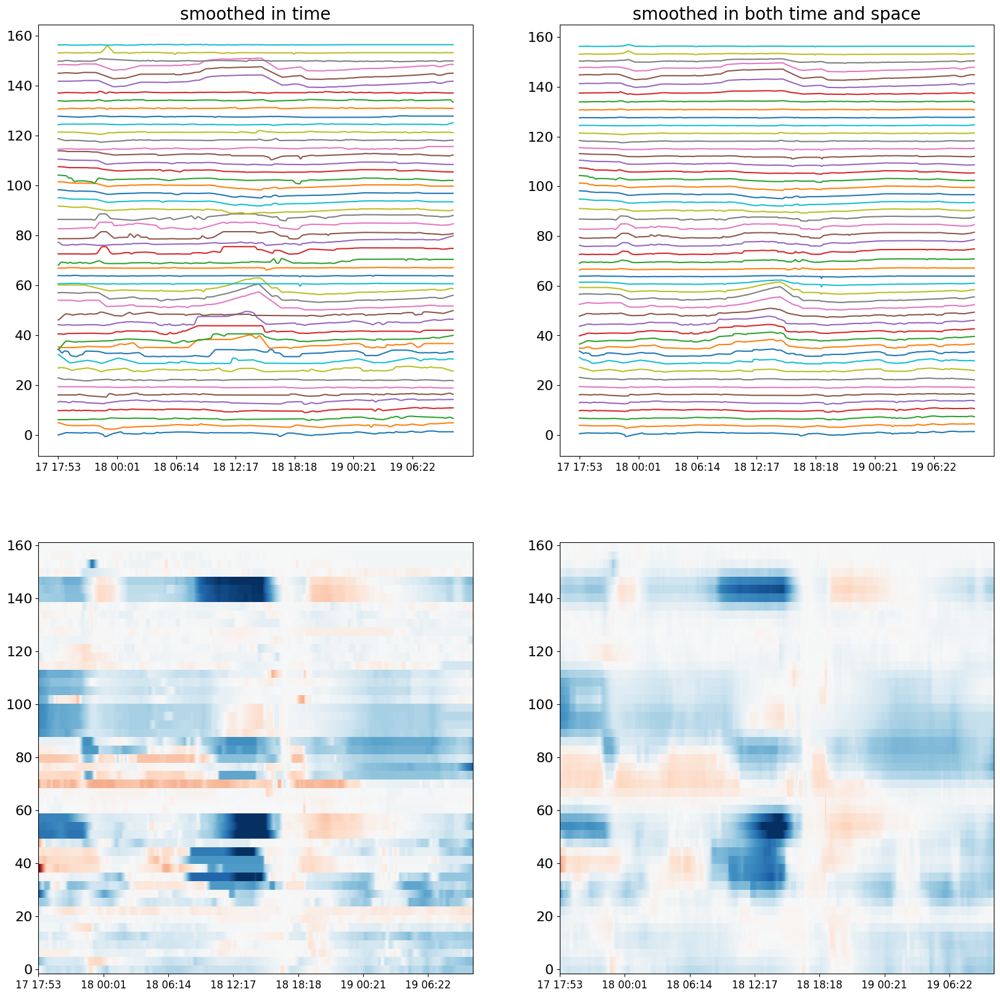

In [81]:
interp_f = interp1d(np.arange(0,2408,5), final_peaks, axis=-1, bounds_error=False, fill_value="extrapolate")
interp_dvv = interp_f(np.arange(2408))
smooth1d_dvv = gaussian_filter1d(interp_dvv, sigma=4, axis=-1)
smooth2d_dvv = gaussian_filter(interp_dvv, sigma=(1, 1))

smooth1d_dvv = smooth1d_dvv - np.repeat(np.mean(smooth1d_dvv[:, 1345:1400], axis=1)[:, np.newaxis], 2408, axis=1)
smooth2d_dvv = smooth2d_dvv - np.repeat(np.mean(smooth2d_dvv[:, 1345:1400], axis=1)[:, np.newaxis], 2408, axis=1)


fig, ax = plt.subplots(2,2, figsize=(20, 20))
for i in range(50):
    ax[0,0].plot(np.arange(2408), 10*smooth1d_dvv[i]+i*3.19, label=f'channel {i}')
    ax[0,1].plot(np.arange(2408), 10*smooth2d_dvv[i]+i*3.19, label=f'channel {i}')

ax[1,0].pcolor(np.arange(2408), np.arange(51)*dchan, smooth1d_dvv, shading='auto', vmin=-0.4, vmax=0.4, cmap = 'RdBu')
ax[1,1].pcolor(np.arange(2408), np.arange(51)*dchan, smooth2d_dvv, shading='auto', vmin=-0.4, vmax=0.4, cmap = 'RdBu')

xax=np.arange(0, ave_psd.shape[-1], 360)
tax=acqu_time[:ave_psd.shape[-1]:360]
hrax=[dt.strftime('%d %H:%M') for dt in tax]
ax[0,0].set_title('smoothed in time', fontsize=20)
ax[0,0].set_xticks(xax)
ax[0,0].set_xticklabels(hrax, fontsize = 12)
ax[0,1].set_title('smoothed in both time and space', fontsize=20)
ax[0,1].set_xticks(xax)
ax[0,1].set_xticklabels(hrax, fontsize = 12)
ax[1,0].set_xticks(xax)
ax[1,0].set_xticklabels(hrax, fontsize = 12)
ax[1,1].set_xticks(xax)
ax[1,1].set_xticklabels(hrax, fontsize = 12)


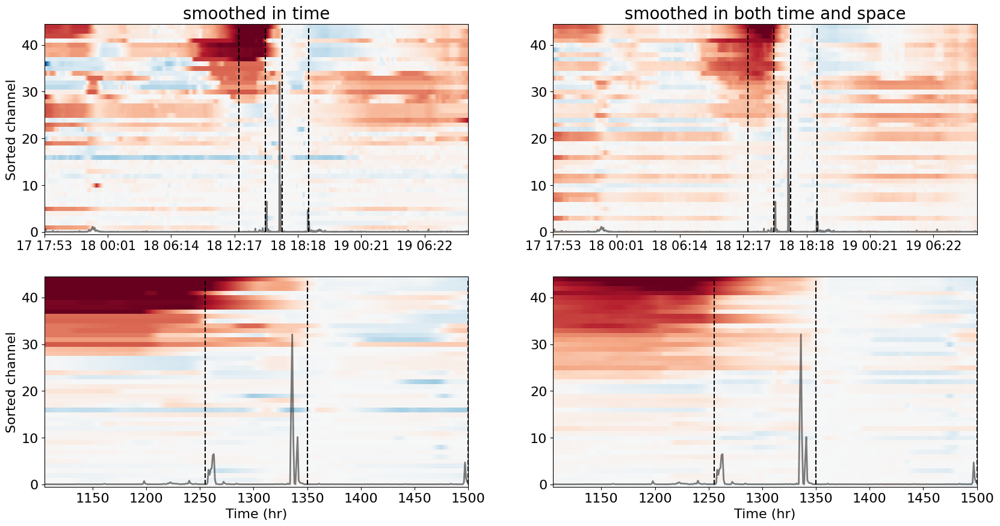

In [ ]:
trim_dvv_smooth1d = smooth1d_dvv[6:51, 1105:1500]
trim_dvv_smooth2d = smooth2d_dvv[6:51, 1105:1500]

variability1 = np.fabs(np.nanmean(trim_dvv_smooth1d[:, :150], axis=1) - np.nanmean(trim_dvv_smooth1d[:, -150:], axis=1))
variability2 = np.fabs(np.nanmean(trim_dvv_smooth2d[:, :150], axis=1) - np.nanmean(trim_dvv_smooth2d[:, -150:], axis=1))
variability_indices1 = np.argsort(variability1) + 6
variability_indices2 = np.argsort(variability2) + 6

fig, ax = plt.subplots(2,2, figsize=(20, 10))

ax[0,0].pcolor(np.arange(2408), np.arange(45), smooth1d_dvv[variability_indices1], shading='auto', vmin=-0.4, vmax=0.4, cmap='RdBu_r')
ax[0,1].pcolor(np.arange(2408), np.arange(45), smooth2d_dvv[variability_indices2], shading='auto', vmin=-0.4, vmax=0.4, cmap='RdBu_r')
ax[1,0].pcolor(np.arange(2408), np.arange(45), smooth1d_dvv[variability_indices1], shading='auto', vmin=-0.4, vmax=0.4, cmap='RdBu_r')
ax[1,1].pcolor(np.arange(2408), np.arange(45), smooth2d_dvv[variability_indices2], shading='auto', vmin=-0.4, vmax=0.4, cmap='RdBu_r')

ax[0,0].plot(np.arange(2408), ave_psd * 50, color='k', lw=2, alpha=0.5, label='rain proxy')
ax[0,1].plot(np.arange(2408), ave_psd * 50, color='k', lw=2, alpha=0.5, label='rain proxy')
ax[1,0].plot(np.arange(2408), ave_psd * 50, color='k', lw=2, alpha=0.5, label='rain proxy')
ax[1,1].plot(np.arange(2408), ave_psd * 50, color='k', lw=2, alpha=0.5, label='rain proxy')

ax[1,0].set_xlim([1105,1500])
ax[1,1].set_xlim([1105,1500])
ax[0,0].set_xticks(xax)
ax[0,0].set_xticklabels(hrax, fontsize=15)
ax[0,1].set_xticks(xax)
ax[0,1].set_xticklabels(hrax, fontsize=15)
ax[1,0].set_xlabel('Time (hr)')
ax[1,1].set_xlabel('Time (hr)')
ax[1,0].set_ylabel('Sorted channel')
ax[0,0].set_ylabel('Sorted channel')
ax[0,0].set_title('smoothed in time', fontsize=20)
ax[0,1].set_title('smoothed in both time and space', fontsize=20)
ax[0,0].vlines([1105, 1255, 1350, 1500], 0, 44, color='k', linestyle='--')
ax[0,1].vlines([1105, 1255, 1350, 1500], 0, 44, color='k', linestyle='--')
ax[1,0].vlines([1105, 1255, 1350, 1500], 0, 44, color='k', linestyle='--')
ax[1,1].vlines([1105, 1255, 1350, 1500], 0, 44, color='k', linestyle='--')



In [89]:
with h5py.File('final_peaks_interp_smooth.h5', 'w') as f:
    f.create_dataset('smooth1d_dvv', data=smooth1d_dvv)
    f.create_dataset('smooth2d_dvv', data=smooth2d_dvv)

# Plot dvv in space

(-0.02, 0.2)

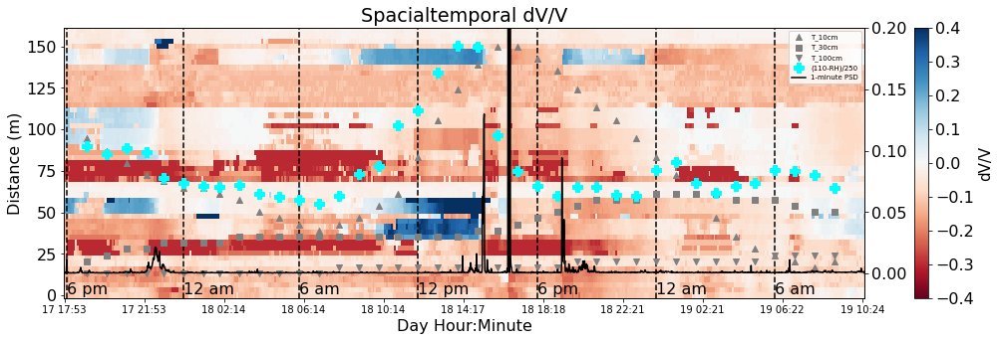

In [14]:
xax=np.arange(0, x.shape[-1], 48)
tax=acqu_time[:2410:240]
plt.figure(figsize=(18, 5))
plt.pcolormesh(x, np.arange(51)*dchan, new_peaks-1, shading='auto', vmin=-0.4, vmax=0.4, cmap = 'RdBu')
plt.title('Spacialtemporal dV/V')
plt.xticks(xax, hrax, fontsize = 10)
bar=plt.colorbar()
bar.set_label('dV/V', fontsize = 15)
plt.xlabel("Day Hour:Minute", fontsize = 16)
plt.ylabel("Distance (m)", fontsize = 16)

for it in Ind6hrs:
    plt.axvline(x = it/5, color = 'k', linestyle='--')
plt.text(Ind6hrs[0]/5, 0.5, '6 pm', color='k')
plt.text(Ind6hrs[1]/5, 0.5, '12 am', color='k')
plt.text(Ind6hrs[2]/5, 0.5, '6 am', color='k')
plt.text(Ind6hrs[3]/5, 0.5, '12 pm', color='k')
plt.text(Ind6hrs[4]/5, 0.5, '6 pm', color='k')
plt.text(Ind6hrs[5]/5, 0.5, '12 am', color='k')
plt.text(Ind6hrs[6]/5, 0.5, '6 am', color='k')

axcopy = plt.twinx()
axcopy.scatter(np.array(hourly_index)/5, (soil_temp_10-7.5)/20, label='T_10cm', color='gray', marker='^')
axcopy.scatter(np.array(hourly_index)/5, (soil_temp_30-7.5)/20, label='T_30cm', color='gray', marker='s')
axcopy.scatter(np.array(hourly_index)/5, (soil_temp_100-7.5)/20, label='T_100cm', color='gray', marker='v')
axcopy.scatter(np.array(hourly_index)/5, (110-humidity)/250, label='(110-RH)/250', color='cyan', marker='P', s=100)
axcopy.plot(np.arange(ave_psd.shape[-1])/5, ave_psd, label='1-minute PSD', color='k')
axcopy.legend(fontsize = 7)
axcopy.set_ylim(-0.02,0.2)

In [15]:
ave=np.repeat(np.mean(new_peaks[:,-10:], axis=1)[:, np.newaxis], 482, axis=1)
amp = new_peaks-ave

Text(427.6, 0.5, '6 am')

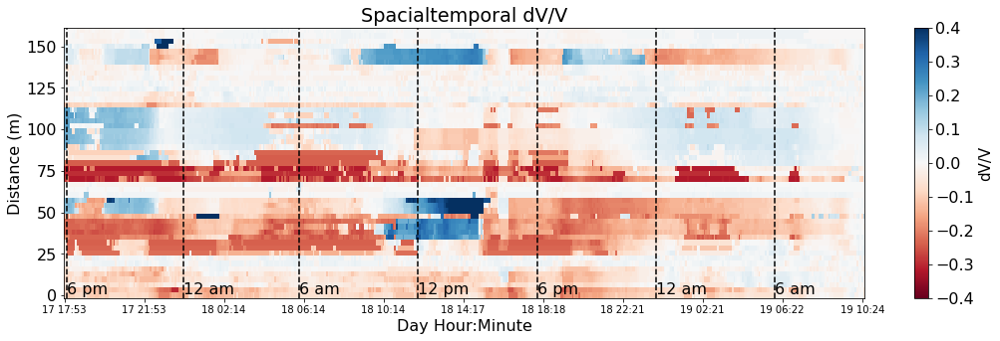

In [16]:
plt.figure(figsize=(18, 5))
plt.pcolormesh(x, np.arange(51)*dchan, amp, shading='auto', vmin=-0.4, vmax=0.4, cmap = 'RdBu')
plt.title('Spacialtemporal dV/V')
plt.xticks(xax, hrax, fontsize = 10)
bar=plt.colorbar()
bar.set_label('dV/V', fontsize = 15)
plt.xlabel("Day Hour:Minute", fontsize = 16)
plt.ylabel("Distance (m)", fontsize = 16)

for it in Ind6hrs:
    plt.axvline(x = it/5, color = 'k', linestyle='--')
plt.text(Ind6hrs[0]/5, 0.5, '6 pm', color='k')
plt.text(Ind6hrs[1]/5, 0.5, '12 am', color='k')
plt.text(Ind6hrs[2]/5, 0.5, '6 am', color='k')
plt.text(Ind6hrs[3]/5, 0.5, '12 pm', color='k')
plt.text(Ind6hrs[4]/5, 0.5, '6 pm', color='k')
plt.text(Ind6hrs[5]/5, 0.5, '12 am', color='k')
plt.text(Ind6hrs[6]/5, 0.5, '6 am', color='k')

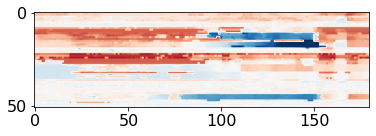

In [ ]:
plt.imshow(amp[:,100:280],vmin=-0.4, vmax=0.4, cmap = 'RdBu')

### Overlap tillage data with dv/v

In [3]:
with h5py.File('/fd1/QibinShi_data/England_farm/enhanced_dvv_cc.hdf5', 'r') as f:
    amp=f["dvv_enhanced"][:]
    cc=f["cc"][:]

with h5py.File('/fd1/QibinShi_data/England_farm/demean_intb.h5', 'r') as f:
    intb=f['demean_intb'][:,:,0]

freqmin=25
freqmax=50
samp_freq = 500
dchan = 3.19

In [4]:
minb= np.nanmin(intb[:,160:250], axis=1)
maxb= np.nanmax(intb[:,160:250], axis=1)

Text(0, 0.5, 'tillage * tire')

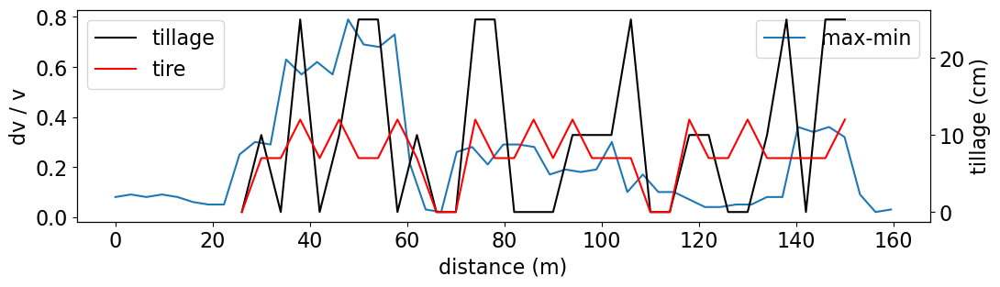

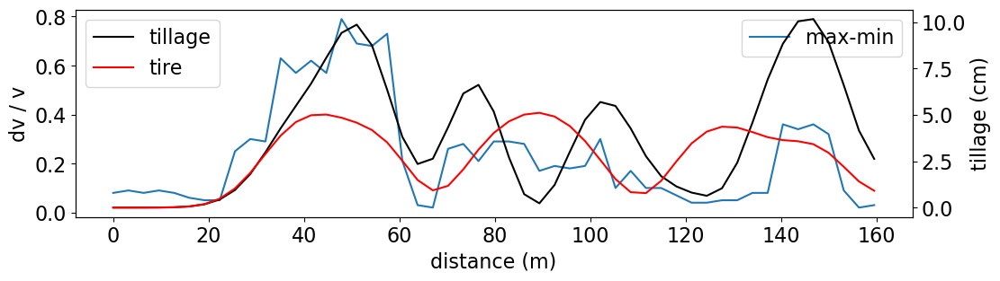

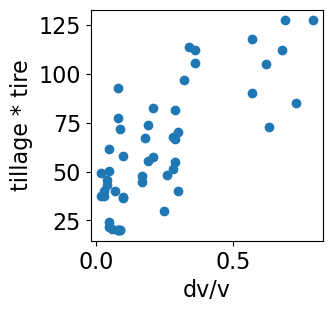

In [5]:
winlen = 5
#### Use two-plot width as the spare the width
tillage = np.array([0, 10, 0, 25, 0, 10, 25, 25, 0, 10,    0,0,     25, 25, 0, 0, 0, 10, 10, 10, 25,   0,0,    10, 10, 0, 0, 10, 25, 0, 25, 25])
tire = np.array([0, 7, 7, 12, 7, 12, 7, 7, 12, 7,   0,0,   12, 7, 7, 12, 7, 12, 7, 7, 7,    0,0,     12, 7, 7, 12, 7, 7, 7, 7, 12])
randomness = np.array([-1, 1, 2, 2, 0, 2, 0, 2, 2, 0, -1,-1, 2, 0, 2, 2, 0, 2, 2, 0, 2, -1,-1, 2, 0, 2, 2, 2, 0, 0, 2, 2])

minamp= np.nanmin(amp[:,160:250], axis=1)
maxamp= np.nanmax(amp[:,160:250], axis=1)
plt.figure(figsize=(12, 3))
# plt.plot(np.arange(51)*dchan, minamp, label='min')
plt.plot(np.arange(51)*dchan, maxamp-minamp, label='max-min')
plt.xlabel("distance (m)", fontsize = 16)
plt.ylabel("dv / v", fontsize = 16)
plt.legend()

axcopy = plt.twinx()
axcopy.plot(np.arange(32)*4+26, tillage, color='k', label='tillage')
axcopy.plot(np.arange(32)*4+26, tire, color='r', label='tire')
axcopy.set_ylabel("tillage (cm)", fontsize = 16)
axcopy.legend()

#### Interpolate tillage and tire pressure
f = interp1d(np.arange(32)*4+26, tillage, bounds_error=False, fill_value=5)
intep_tillage = f(np.arange(51)*dchan)
conv_tillage = np.convolve(intep_tillage, np.ones(winlen)/winlen, mode='same')
f = interp1d(np.arange(32)*4+26, tire, bounds_error=False, fill_value=4)
intep_tire = f(np.arange(51)*dchan)
conv_tire = np.convolve(intep_tire, np.ones(winlen)/winlen, mode='same')

conv_dvv = np.convolve(maxamp-minamp, np.ones(1)/1, mode='same')

conv_tillage = gaussian_filter1d(intep_tillage, sigma=2, mode='reflect')
conv_tire = gaussian_filter1d(intep_tire, sigma=2, mode='reflect')

plt.figure(figsize=(12, 3))
# plt.plot(np.arange(51)*dchan, minamp, label='min')
plt.plot(np.arange(51)*dchan, conv_dvv, label='max-min')
plt.xlabel("distance (m)", fontsize = 16)
plt.ylabel("dv / v", fontsize = 16)
plt.legend()

axcopy = plt.twinx()
axcopy.plot(np.arange(51)*dchan, conv_tillage-5, color='k', label='tillage')
axcopy.plot(np.arange(51)*dchan, conv_tire-4, color='r', label='tire')
axcopy.set_ylabel("tillage (cm)", fontsize = 16)
axcopy.legend()


#### covariance
plt.figure(figsize=(3, 3))
plt.plot(conv_dvv,conv_tillage*conv_tire,'o')
plt.xlabel("dv/v", fontsize = 16)
plt.ylabel("tillage * tire", fontsize = 16)

Text(0, 0.5, 'tillage * tire')

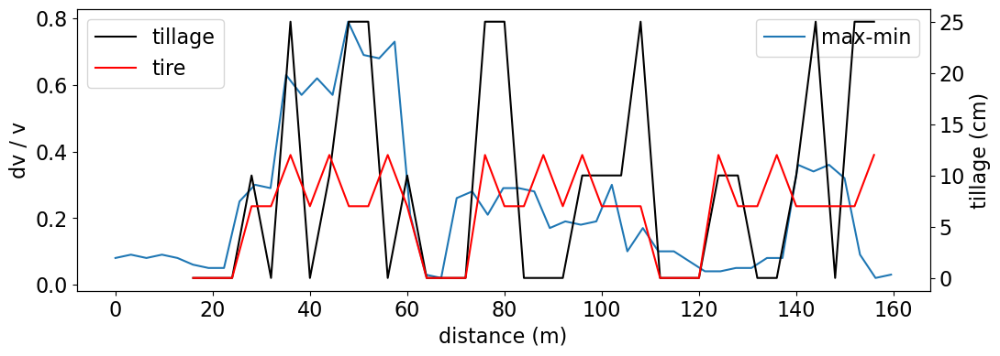

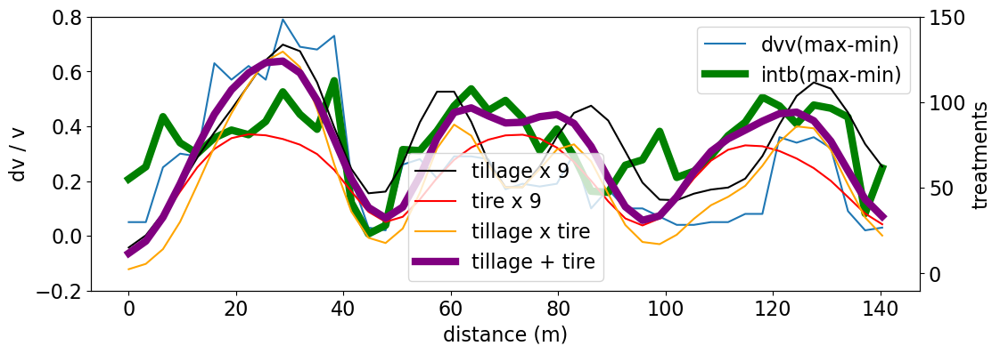

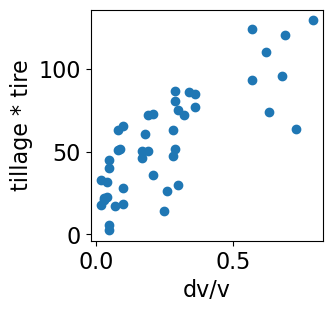

In [6]:
winlen = 5
convmode = 'same'
#### Use three-plot width as the spare the width
tillage = np.array([0,0,0,   10, 0, 25, 0, 10, 25, 25, 0, 10,    0,0,0,    25, 25, 0, 0, 0, 10, 10, 10, 25,    0,0,0,   10, 10, 0, 0, 10, 25, 0, 25, 25])
tire = np.array([0,0,0,  7, 7, 12, 7, 12, 7, 7, 12, 7,    0,0,0,     12, 7, 7, 12, 7, 12, 7, 7, 7,    0,0,0,    12, 7, 7, 12, 7, 7, 7, 7, 12])
randomness = np.array([-1,-1,-1, 1, 2, 2, 0, 2, 0, 2, 2, 0, -1,-1,-1, 2, 0, 2, 2, 0, 2, 2, 0, 2, -1,-1,-1, 2, 0, 2, 2, 2, 0, 0, 2, 2])

plt.figure(figsize=(12, 4))
# plt.plot(np.arange(51)*dchan, minamp, label='min')
plt.plot(np.arange(51)*dchan, maxamp-minamp, label='max-min')
plt.xlabel("distance (m)", fontsize = 16)
plt.ylabel("dv / v", fontsize = 16)
plt.legend()

axcopy = plt.twinx()
axcopy.set_ylabel("tillage (cm)", fontsize = 16)
axcopy.plot(np.arange(36)*4+16, tillage, color='k', label='tillage')
axcopy.plot(np.arange(36)*4+16, tire, color='r', label='tire')
axcopy.legend()

#### Interpolate tillage and tire pressure
f = interp1d(np.arange(36)*4-3, tillage, bounds_error=False, fill_value=1)
intep_tillage = f(np.arange(51-6)*dchan)
conv_tillage = np.convolve(intep_tillage, np.ones(winlen)/winlen, mode=convmode)
f = interp1d(np.arange(36)*4-3, tire, bounds_error=False, fill_value=1)
intep_tire = f(np.arange(51-6)*dchan)
conv_tire = np.convolve(intep_tire, np.ones(winlen)/winlen, mode=convmode)

conv_dvv = np.convolve(maxamp-minamp, np.ones(1)/1, mode=convmode)
# conv_intb= np.convolve(maxb-minb, np.ones(3)/3, mode=convmode)

conv_tillage = gaussian_filter1d(intep_tillage, sigma=2, mode='reflect')
conv_tire = gaussian_filter1d(intep_tire, sigma=2, mode='reflect')
# conv_dvv = gaussian_filter1d(maxamp-minamp, sigma=1, mode='reflect')
conv_intb = gaussian_filter1d(maxb-minb, sigma=0.5, mode='reflect')



plt.figure(figsize=(12, 4))
# plt.plot(np.arange(51)*dchan, minamp, label='min')
plt.plot(np.arange(len(conv_dvv[6:]))*dchan, conv_dvv[6:], label='dvv(max-min)')
plt.plot(np.arange(len(conv_intb[6:]))*dchan, conv_intb[6:]/80, label='intb(max-min)', color='g', lw=6)
plt.xlabel("distance (m)", fontsize = 16)
plt.ylabel("dv / v", fontsize = 16)
plt.legend()
plt.ylim(-0.2, 0.8)

axcopy = plt.twinx()
axcopy.plot(np.arange(len(conv_tillage))*dchan, conv_tillage*9, color='k', label='tillage x 9')
axcopy.plot(np.arange(len(conv_tire))*dchan, conv_tire*9, color='r', label='tire x 9')
axcopy.plot(np.arange(len(conv_tire))*dchan, conv_tillage*conv_tire, color='orange', label='tillage x tire')
axcopy.plot(np.arange(len(conv_tire))*dchan, (conv_tire*15+conv_tillage*conv_tire)/2.1, color='purple', label='tillage + tire', lw=6)
axcopy.set_ylabel("treatments", fontsize = 16)
axcopy.legend()
axcopy.set_ylim(-10, 150)


#### covariance
plt.figure(figsize=(3, 3))
plt.plot(conv_dvv[6:],conv_tillage*conv_tire,'o')
plt.xlabel("dv/v", fontsize = 16)
plt.ylabel("tillage * tire", fontsize = 16)


In [16]:
interp_paras = pd.DataFrame(data={'dvv_varibility': conv_dvv[6:],
                                'intb_varibility': conv_intb[6:],
                                'tillage_depth': conv_tillage, 
                                'tire_pressure': conv_tire})

interp_paras.to_csv('/fd1/QibinShi_data/England_farm/interp_dv_b_tillage_tire.csv')

In [24]:
with h5py.File('/fd1/QibinShi_data/England_farm/enhanced_dvv_cc.hdf5', 'w') as f:
    f.create_dataset("dvv_enhanced", data=amp)
    f.create_dataset("cc", data=cc_dvv)

### Save

In [ ]:
# with h5py.File('/fd1/QibinShi_data/England_farm/all_dvv_denoised.hdf5', 'w') as f:
#     f.create_dataset("dvv_denoised", data=new_dvv)
#     f.create_dataset("cc_denoised", data=new_cc)

### Interpolate soil measurements

In [25]:
interpx = np.arange(ave_psd.shape[0])

interp_f = interp1d(hourly_index, humidity, bounds_error=False, fill_value="extrapolate")
interp_humidity = interp_f(interpx)

interp_f = interp1d(hourly_index, soil_temp_10, bounds_error=False, fill_value="extrapolate")
interp_temp10 = interp_f(interpx)

interp_f = interp1d(np.arange(0,ave_psd.shape[0],5), new_peaks, axis=-1, bounds_error=False, fill_value="extrapolate")
interp_dvv = interp_f(interpx)

interp_f = interp1d(np.arange(0,ave_psd.shape[0],5), cc_dvv, axis=-1, bounds_error=False, fill_value="extrapolate")
interp_cc = interp_f(interpx)

In [26]:
xax=np.arange(0, ave_psd.shape[-1], 240)
tax=acqu_time[:ave_psd.shape[-1]:240]
hrax=[dt.strftime('%d %H:%M') for dt in tax]

(-0.02, 0.2)

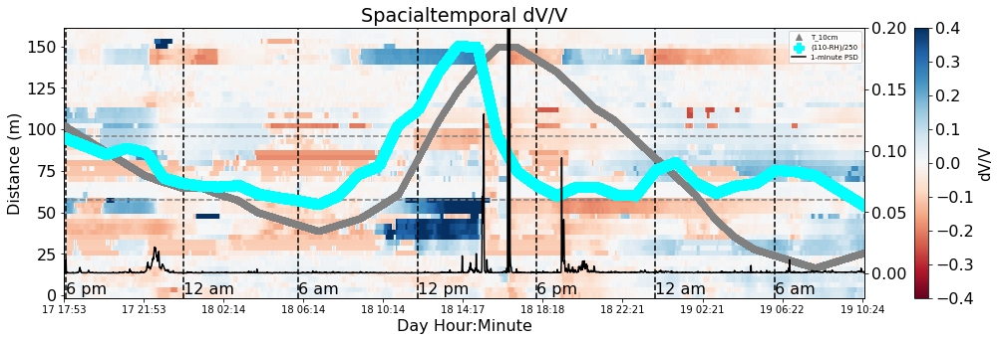

In [27]:
plt.figure(figsize=(18, 5))

plt.pcolormesh(interpx, np.arange(51)*dchan, interp_dvv-np.mean(interp_dvv, axis=1, keepdims=True), shading='auto', vmin=-0.4, vmax=0.4, cmap = 'RdBu')
plt.title('Spacialtemporal dV/V')
plt.xticks(xax, hrax, fontsize = 10)
bar=plt.colorbar()
bar.set_label('dV/V', fontsize = 15)
plt.xlabel("Day Hour:Minute", fontsize = 16)
plt.ylabel("Distance (m)", fontsize = 16)

plt.axhline(y = 18*dchan, color = 'gray', linestyle='--')
plt.axhline(y = 30*dchan, color = 'gray', linestyle='--')
for it in Ind6hrs:
    plt.axvline(x = it, color = 'k', linestyle='--')
plt.text(Ind6hrs[0], 0.5, '6 pm', color='k')
plt.text(Ind6hrs[1], 0.5, '12 am', color='k')
plt.text(Ind6hrs[2], 0.5, '6 am', color='k')
plt.text(Ind6hrs[3], 0.5, '12 pm', color='k')
plt.text(Ind6hrs[4], 0.5, '6 pm', color='k')
plt.text(Ind6hrs[5], 0.5, '12 am', color='k')
plt.text(Ind6hrs[6], 0.5, '6 am', color='k')

axcopy = plt.twinx()
axcopy.scatter(interpx, (interp_temp10-7.5)/20, label='T_10cm', color='gray', marker='^')
axcopy.scatter(interpx, (110-interp_humidity)/250, label='(110-RH)/250', color='cyan', marker='P', s=100)
axcopy.plot(interpx, ave_psd, label='1-minute PSD', color='k')
axcopy.legend(fontsize = 7)
axcopy.set_ylim(-0.02,0.2)

In [208]:
with h5py.File('/fd1/QibinShi_data/England_farm/interp_dvv_temp_moisture.hdf5', 'w') as f:
    f.create_dataset("dvv", data=interp_dvv)
    f.create_dataset("cc", data=interp_cc)
    f.create_dataset("temperature", data=interp_temp10)
    f.create_dataset("moisture", data=interp_humidity)
    f.create_dataset("psd_rain", data=ave_psd)